Lambertian DEM Roughness (mean): 0.0747882632923183
Lambertian+CLAHE DEM Roughness (mean): 0.09931190566441808
Lambertian DEM Local Variance (mean): 0.007142665367989873
Lambertian+CLAHE DEM Local Variance (mean): 0.012940122102524022


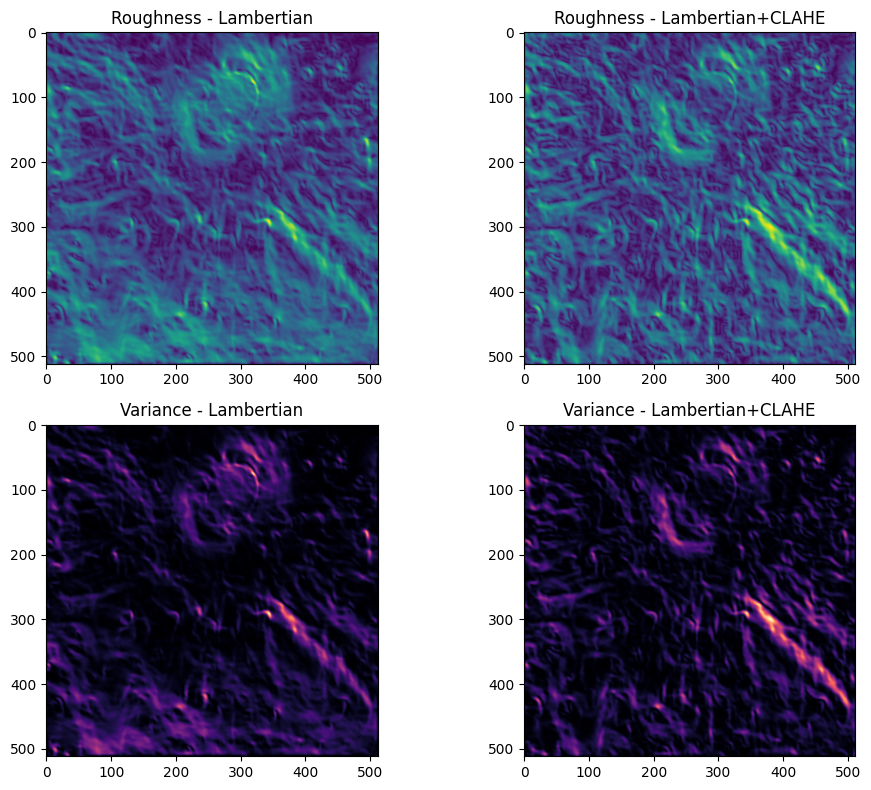

In [2]:
#ROUGHNESS METRICS FOR LAMBERTIAN V/S LAMBERTIAN WITH CLAHE
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

# Load both DEM arrays
dem1 = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\lambertian_dem.npy")
dem2 = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\lambertian_clahe_dem.npy")

# Functions
def compute_roughness(dem_array, window=3):
    footprint = np.ones((window, window))
    return ndimage.generic_filter(dem_array, np.std, footprint=footprint)

def compute_local_variance(dem_array, window=3):
    footprint = np.ones((window, window))
    return ndimage.generic_filter(dem_array, np.var, footprint=footprint)

# Compute metrics
roughness1, roughness2 = compute_roughness(dem1), compute_roughness(dem2)
variance1, variance2   = compute_local_variance(dem1), compute_local_variance(dem2)

# Print summary comparison
print("Lambertian DEM Roughness (mean):", np.mean(roughness1))
print("Lambertian+CLAHE DEM Roughness (mean):", np.mean(roughness2))
print("Lambertian DEM Local Variance (mean):", np.mean(variance1))
print("Lambertian+CLAHE DEM Local Variance (mean):", np.mean(variance2))

# Plot maps
fig, axs = plt.subplots(2, 2, figsize=(10, 8))
axs[0,0].imshow(roughness1, cmap='viridis'); axs[0,0].set_title("Roughness - Lambertian")
axs[0,1].imshow(roughness2, cmap='viridis'); axs[0,1].set_title("Roughness - Lambertian+CLAHE")
axs[1,0].imshow(variance1, cmap='magma'); axs[1,0].set_title("Variance - Lambertian")
axs[1,1].imshow(variance2, cmap='magma'); axs[1,1].set_title("Variance - Lambertian+CLAHE")
plt.tight_layout(); plt.show()


Hapke DEM Roughness (mean): 0.09517256
Hapke+CLAHE DEM Roughness (mean): 0.12558529
Hapke DEM Local Variance (mean): 0.016945781
Hapke+CLAHE DEM Local Variance (mean): 0.02512201


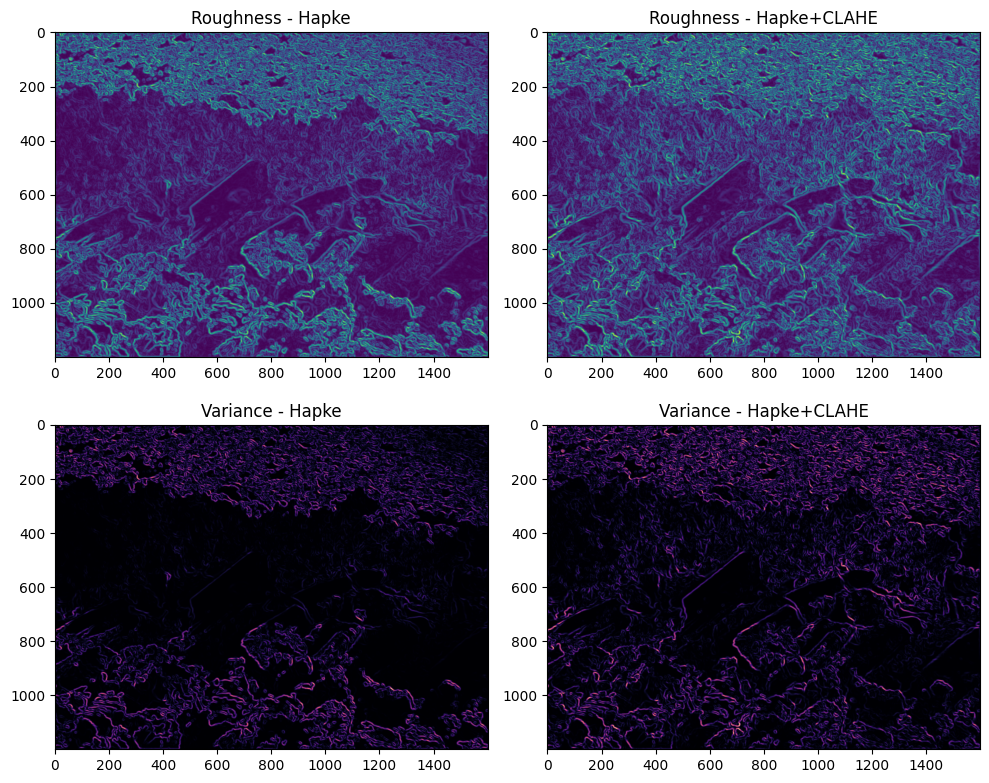

In [2]:
#ROUGHNESS METRICS FOR HAPKE MODEL V/S HAPKE WITH CLAHE
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

# Load both DEM arrays (already saved earlier as .npy files)
dem1 = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\hapke_dem.npy")        # Hapke
dem2 = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\hapke_clahe_dem.npy")  # Hapke + CLAHE

# Functions
def compute_roughness(dem_array, window=3):
    footprint = np.ones((window, window))
    return ndimage.generic_filter(dem_array, np.std, footprint=footprint)

def compute_local_variance(dem_array, window=3):
    footprint = np.ones((window, window))
    return ndimage.generic_filter(dem_array, np.var, footprint=footprint)

# Compute metrics
roughness1, roughness2 = compute_roughness(dem1), compute_roughness(dem2)
variance1, variance2   = compute_local_variance(dem1), compute_local_variance(dem2)

# Print summary comparison
print("Hapke DEM Roughness (mean):", np.mean(roughness1))
print("Hapke+CLAHE DEM Roughness (mean):", np.mean(roughness2))
print("Hapke DEM Local Variance (mean):", np.mean(variance1))
print("Hapke+CLAHE DEM Local Variance (mean):", np.mean(variance2))

# Plot maps
fig, axs = plt.subplots(2, 2, figsize=(10, 8))
axs[0,0].imshow(roughness1, cmap='viridis'); axs[0,0].set_title("Roughness - Hapke")
axs[0,1].imshow(roughness2, cmap='viridis'); axs[0,1].set_title("Roughness - Hapke+CLAHE")
axs[1,0].imshow(variance1, cmap='magma'); axs[1,0].set_title("Variance - Hapke")
axs[1,1].imshow(variance2, cmap='magma'); axs[1,1].set_title("Variance - Hapke+CLAHE")
plt.tight_layout(); plt.show()


Processing factor 1 ...
Processing factor 2 ...
Processing factor 4 ...
Processing factor 8 ...
Processing factor 16 ...


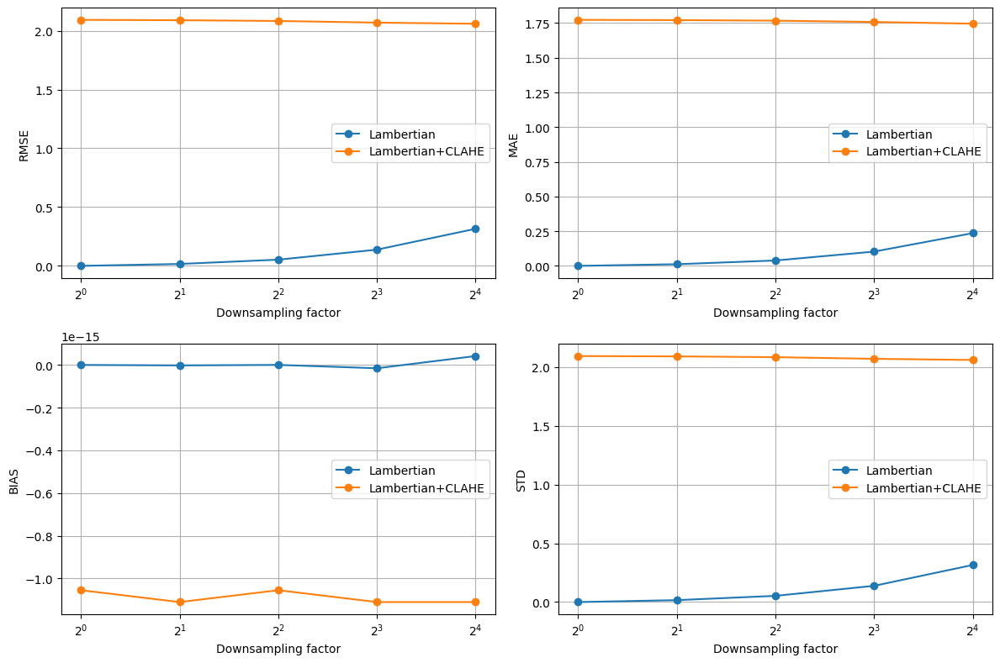

Processing factor 1 ...
Processing factor 2 ...
Processing factor 4 ...
Processing factor 8 ...
Processing factor 16 ...


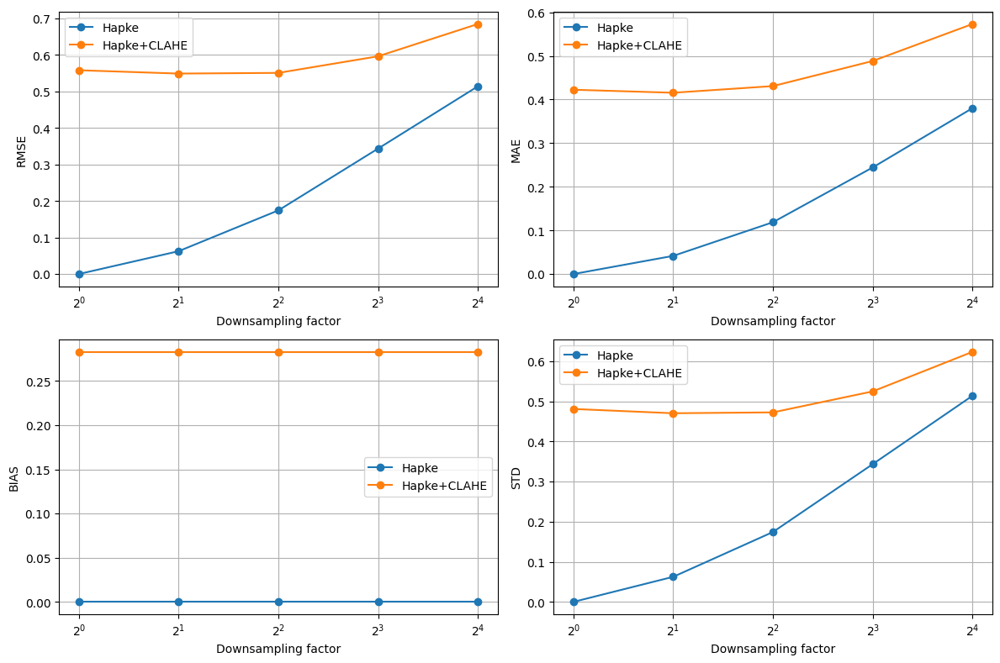

In [1]:
# Multiresolution analysis (compare DEM errors at different spatial resolutions)
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from skimage.transform import resize

# -------------------------
# Utility functions
# -------------------------
def mask_valid(arr):
    return ~np.isnan(arr)

def anti_alias_and_downsample(dem, factor, sigma=None):
    """
    Anti-alias (Gaussian) then downsample by integer factor using average pooling.
    """
    if factor == 1:
        return dem.copy()
    if sigma is None:
        sigma = factor / 2.0
    dem_blur = gaussian_filter(np.nan_to_num(dem), sigma=sigma)
    h, w = dem_blur.shape
    H = (h // factor) * factor
    W = (w // factor) * factor
    dem_crop = dem_blur[:H, :W]
    dem_coarse = dem_crop.reshape(H//factor, factor, W//factor, factor).mean(axis=(1,3))
    return dem_coarse

def upsample_to_ref(coarse_dem, ref_shape, order=1):
    """
    Upsample coarse_dem to ref_shape using interpolation.
    """
    up = resize(coarse_dem, ref_shape, order=order, mode='edge',
                anti_aliasing=False, preserve_range=True)
    return up

def compute_error_metrics(ref, recon, valid_mask=None):
    """
    Compute RMSE, MAE, bias, std(residuals).
    """
    if valid_mask is None:
        valid_mask = mask_valid(ref) & mask_valid(recon)
    r = ref[valid_mask]
    s = recon[valid_mask]
    resid = s - r
    rmse = np.sqrt(np.mean(resid**2))
    mae = np.mean(np.abs(resid))
    bias = np.mean(resid)
    std = np.std(resid)
    return {'rmse':rmse, 'mae':mae, 'bias':bias, 'std':std, 'count':r.size}

def multires_analysis_with_dems(ref_dem, dem_list, names, factors=[1,2,4,8,16], sigma_scale=None, interp_order=1):
    """
    Performs multiresolution analysis and also stores reconstructed DEMs.
    """
    results = {name: [] for name in names}
    recons = {name: {} for name in names}   # store reconstructed DEMs
    for f in factors:
        print(f"Processing factor {f} ...")
        for dem, name in zip(dem_list, names):
            coarse = anti_alias_and_downsample(dem, f, sigma=(f/2.0 if sigma_scale is None else sigma_scale))
            recon = upsample_to_ref(coarse, ref_dem.shape, order=interp_order)
            metrics = compute_error_metrics(ref_dem, recon)
            metrics['factor'] = f
            results[name].append(metrics)
            recons[name][f] = recon   # save reconstructed DEM for later slope/aspect analysis
    return results, recons

# -------------------------
# Plotting helpers
# -------------------------
def plot_metrics(results, names, factors=[1,2,4,8,16]):
    fig, ax = plt.subplots(2,2, figsize=(12,8))
    ax = ax.ravel()
    metrics_keys = ['rmse', 'mae', 'bias', 'std']
    for i, key in enumerate(metrics_keys):
        for name in names:
            vals = [r[key] for r in results[name]]
            ax[i].plot(factors, vals, marker='o', label=name)
        ax[i].set_xscale('log', base=2)
        ax[i].set_xticks(factors)
        ax[i].set_xlabel('Downsampling factor')
        ax[i].set_ylabel(key.upper())
        ax[i].grid(True)
        ax[i].legend()
    plt.tight_layout()
    plt.show()

def plot_residual_map(ref, recon, title='Residuals'):
    resid = recon - ref
    plt.figure(figsize=(6,6))
    plt.imshow(resid, cmap='bwr', vmin=-np.nanmax(np.abs(resid)), vmax=np.nanmax(np.abs(resid)))
    plt.colorbar(label='reconstruction - reference')
    plt.title(title)
    plt.show()

# -------------------------
# Load DEM arrays
# -------------------------
dem_lamb = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\lambertian_dem.npy")
dem_lamb_clahe = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\lambertian_clahe_dem.npy")
dem_hapke = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\hapke_dem.npy")
dem_hapke_clahe = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\hapke_clahe_dem.npy")

# -------------------------
# Run comparisons
# -------------------------
factors = [1,2,4,8,16]

# Example A: Lambertian
ref_dem = dem_lamb
dem_list = [dem_lamb, dem_lamb_clahe]
names = ['Lambertian', 'Lambertian+CLAHE']
resultsA, reconsA = multires_analysis_with_dems(ref_dem, dem_list, names, factors=factors)
plot_metrics(resultsA, names, factors=factors)

# Example B: Hapke
ref_dem = dem_hapke
dem_list = [dem_hapke, dem_hapke_clahe]
names = ['Hapke', 'Hapke+CLAHE']
resultsB, reconsB = multires_analysis_with_dems(ref_dem, dem_list, names, factors=factors)
plot_metrics(resultsB, names, factors=factors)


Processing factor 1 ...
Processing factor 2 ...
Processing factor 4 ...
Processing factor 8 ...
Processing factor 16 ...


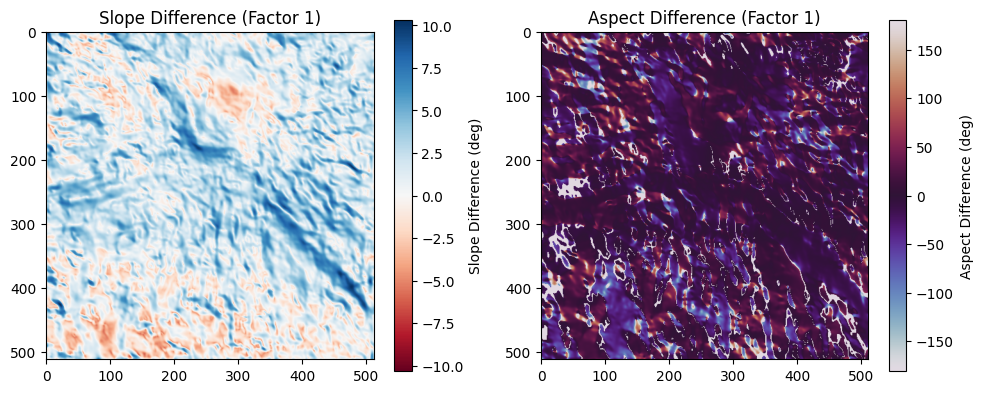

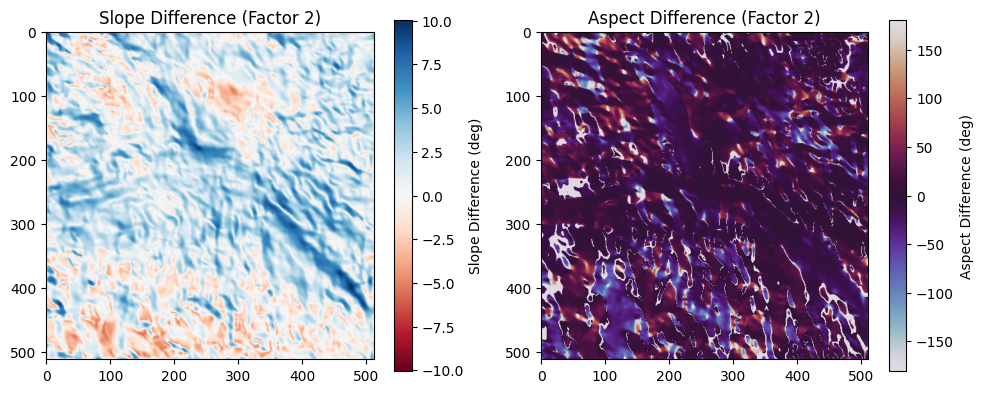

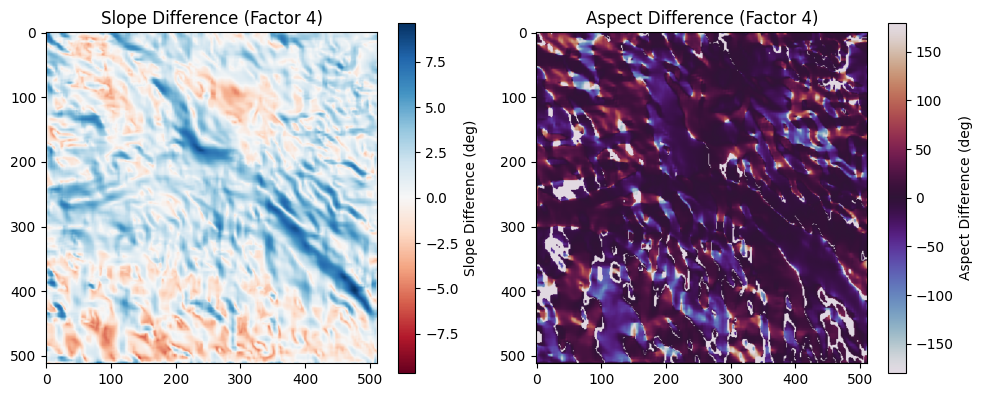

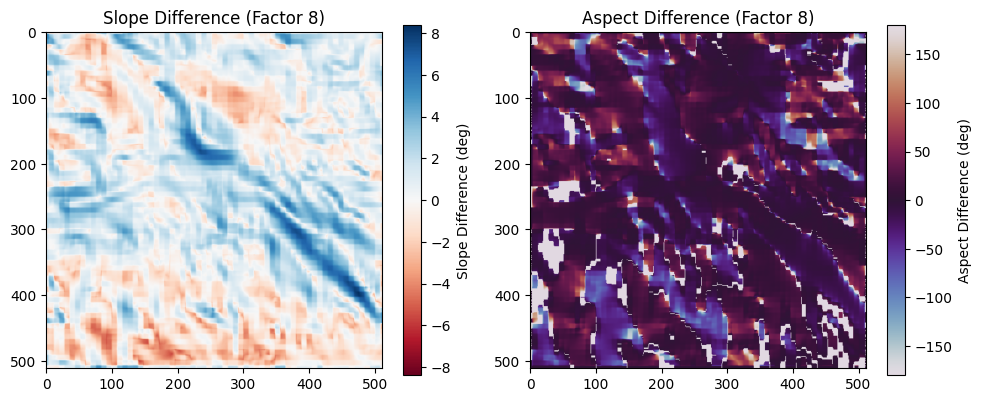

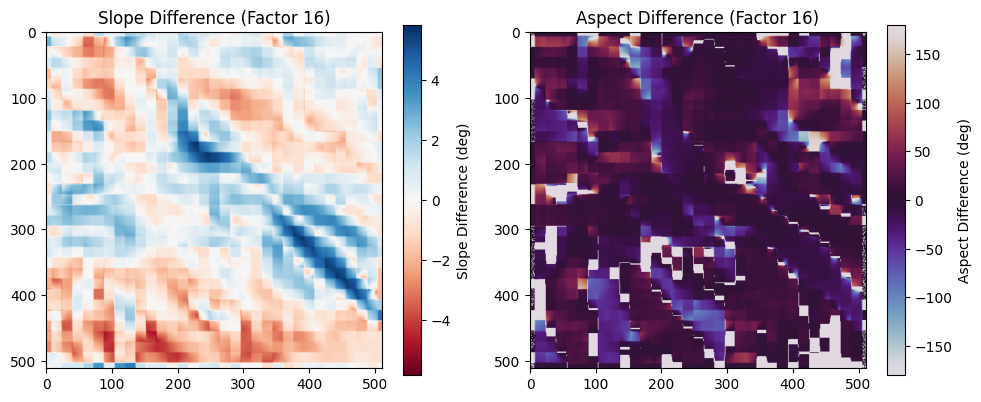

In [ ]:
#slope aspect difference maps
def compute_slope_aspect(dem, cellsize=1.0):
    """
    Compute slope (in degrees) and aspect (in degrees) from DEM.
    """
    # Handle NaNs
    dem = np.nan_to_num(dem)

    # Gradients in x and y directions
    dzdx = np.gradient(dem, axis=1) / cellsize
    dzdy = np.gradient(dem, axis=0) / cellsize

    # Slope (degrees)
    slope = np.degrees(np.arctan(np.sqrt(dzdx**2 + dzdy**2)))

    # Aspect (degrees clockwise from north)
    aspect = np.degrees(np.arctan2(-dzdx, dzdy))
    aspect = np.where(aspect < 0, 360 + aspect, aspect)  # Normalize to [0,360)

    return slope, aspect


def slope_aspect_differences(recons, names, factors):
    """
    Compute slope and aspect difference maps between pairs of DEMs.
    Assumes names has exactly two DEMs (e.g., ['Lambertian', 'Lambertian+CLAHE']).
    """
    assert len(names) == 2, "Need exactly 2 DEMs for slope/aspect comparison"
    diffs = []

    for f in factors:   # <--- use f directly, not enumerate
        slope1, aspect1 = compute_slope_aspect(recons[names[0]][f])
        slope2, aspect2 = compute_slope_aspect(recons[names[1]][f])

        slope_diff = slope2 - slope1
        aspect_diff = aspect2 - aspect1

        diffs.append({'factor': f, 'slope_diff': slope_diff, 'aspect_diff': aspect_diff})

        # Plot slope difference
        plt.figure(figsize=(10,4))
        plt.subplot(1,2,1)
        plt.imshow(slope_diff, cmap='RdBu',
                   vmin=-np.nanmax(abs(slope_diff)),
                   vmax=np.nanmax(abs(slope_diff)))
        plt.colorbar(label='Slope Difference (deg)')
        plt.title(f"Slope Difference (Factor {f})")

        # Plot aspect difference
        plt.subplot(1,2,2)
        plt.imshow(aspect_diff, cmap='twilight', vmin=-180, vmax=180)
        plt.colorbar(label='Aspect Difference (deg)')
        plt.title(f"Aspect Difference (Factor {f})")

        plt.tight_layout()
        plt.show()

    return diffs
factors = [1,2,4,8,16]

ref_dem = dem_lamb
dem_list = [dem_lamb, dem_lamb_clahe]
names = ['Lambertian', 'Lambertian+CLAHE']

resultsA, reconsA = multires_analysis_with_dems(ref_dem, dem_list, names, factors=factors)

diffsA = slope_aspect_differences(reconsA, names, factors)


Processing factor 1 ...
Processing factor 2 ...
Processing factor 4 ...
Processing factor 8 ...
Processing factor 16 ...


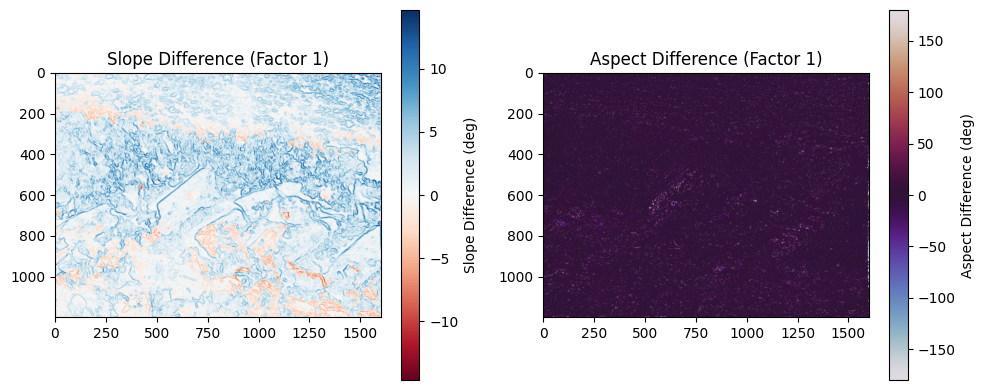

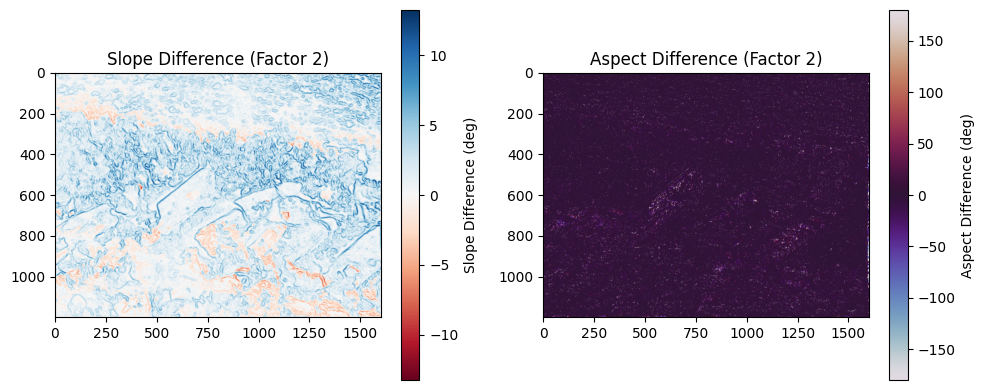

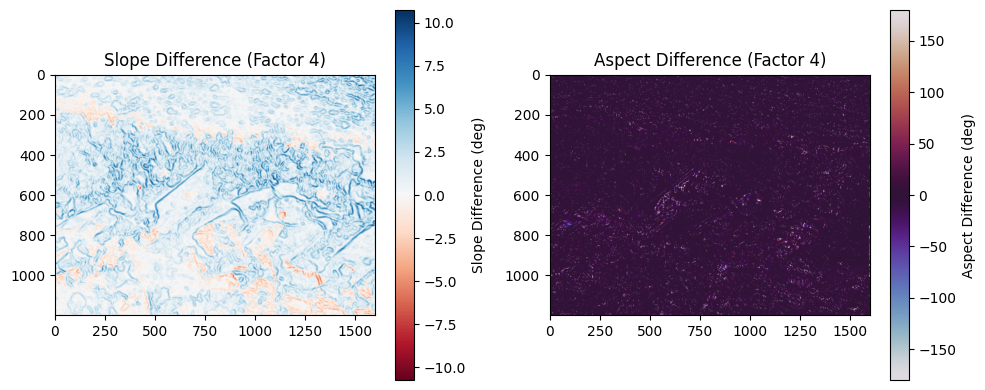

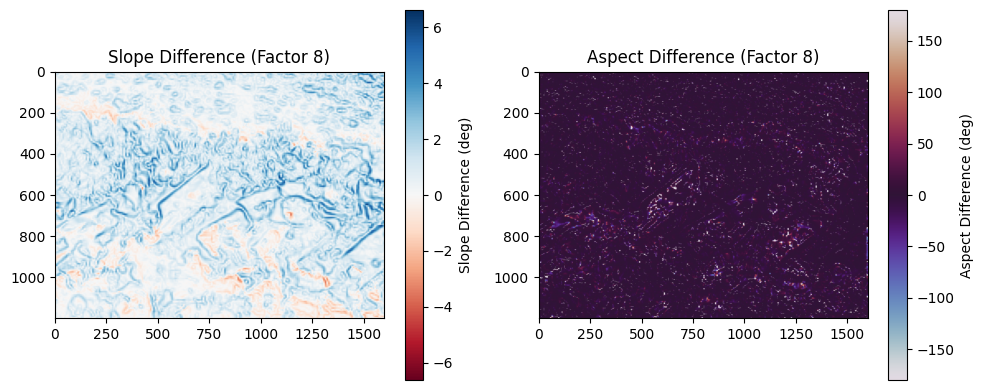

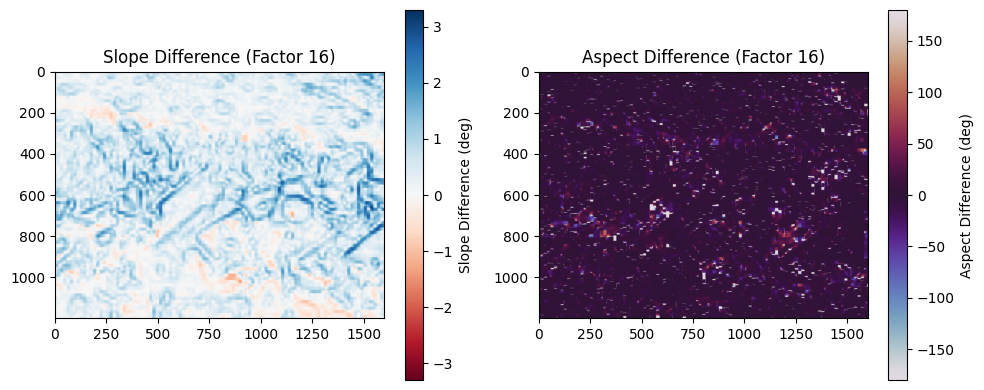

In [7]:
# Hapke vs Hapke+CLAHE
factors = [1,2,4,8,16]

ref_dem = dem_hapke
dem_list = [dem_hapke, dem_hapke_clahe]
names = ['Hapke', 'Hapke+CLAHE']

resultsB, reconsB = multires_analysis_with_dems(ref_dem, dem_list, names, factors=factors)

diffsB = slope_aspect_differences(reconsB, names, factors)


In [8]:
#calculate spatial error maps (where dem deviates the most)
def compute_error_maps(ref_dem, recons, names, factors):
    """
    Compute and plot spatial error maps (residuals) at each scale.
    recons: dictionary of reconstructed DEMs for each name and factor
    """
    for name in names:
        for f in factors:
            recon = recons[name][f]
            error_map = recon - ref_dem  # residuals (positive = overestimate, negative = underestimate)

            plt.figure(figsize=(6,5))
            plt.imshow(error_map, cmap='bwr',
                       vmin=-np.nanmax(np.abs(error_map)),
                       vmax=np.nanmax(np.abs(error_map)))
            plt.colorbar(label='Error (reconstructed - reference)')
            plt.title(f"Error Map: {name}, Factor {f}")
            plt.tight_layout()
            plt.show()


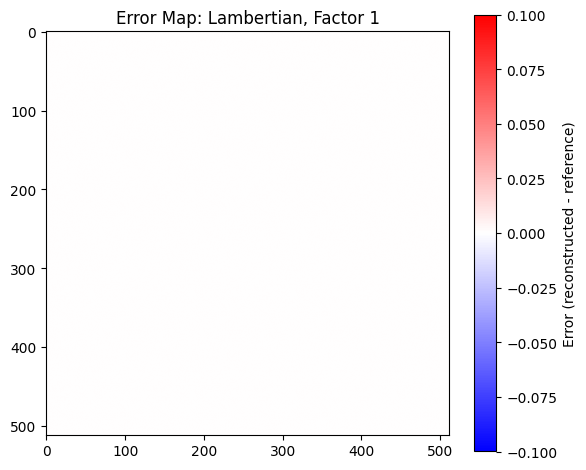

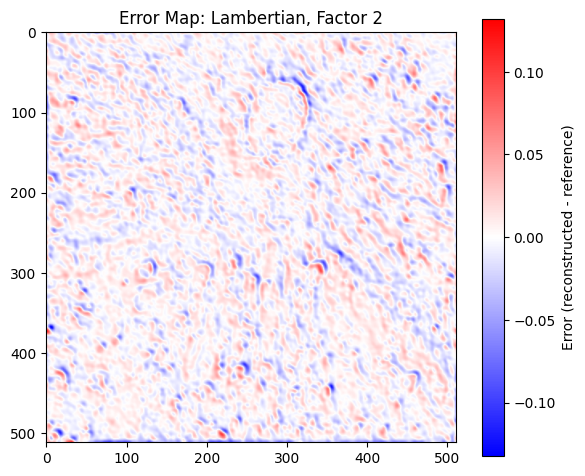

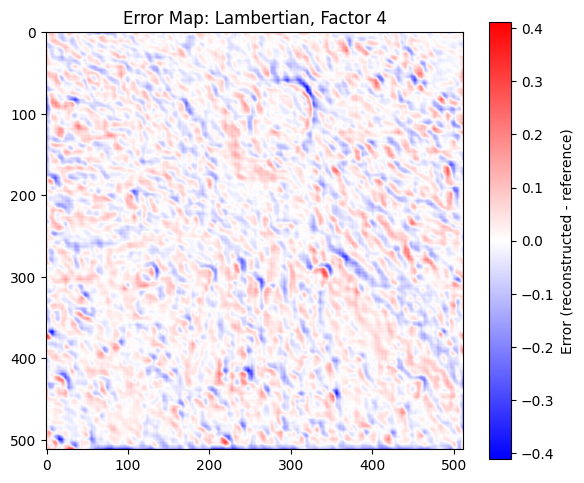

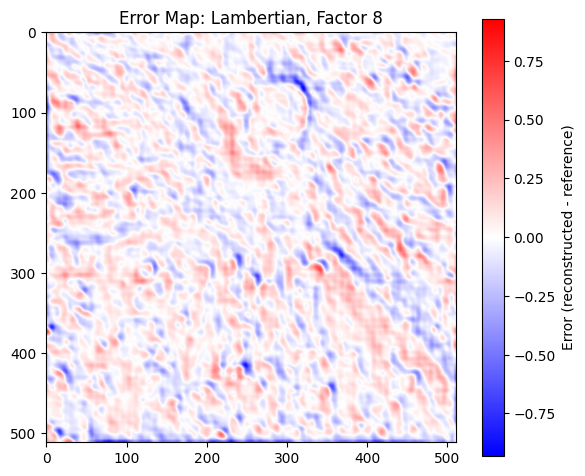

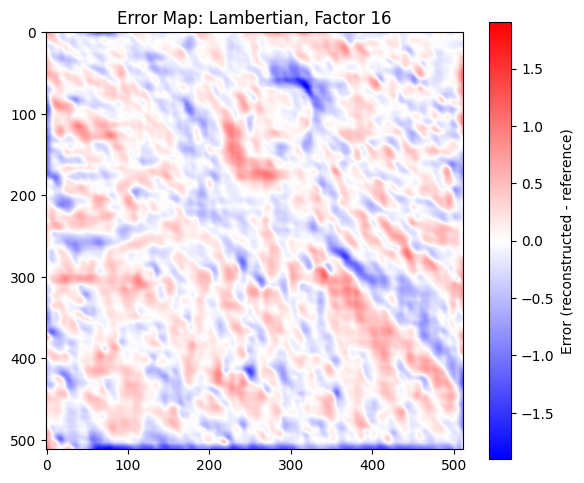

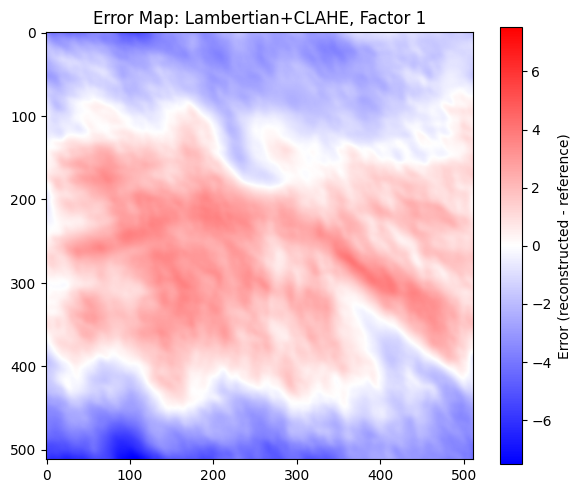

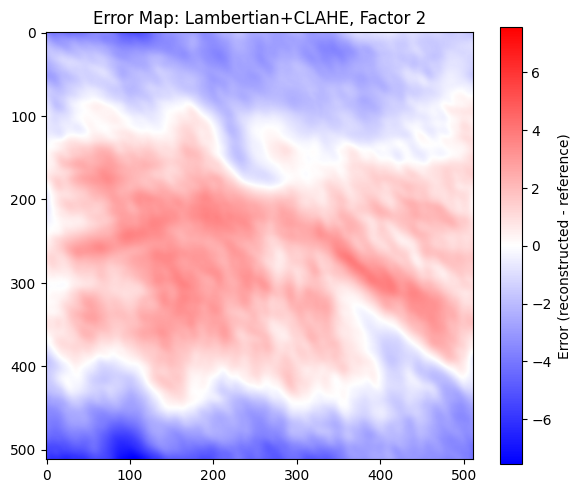

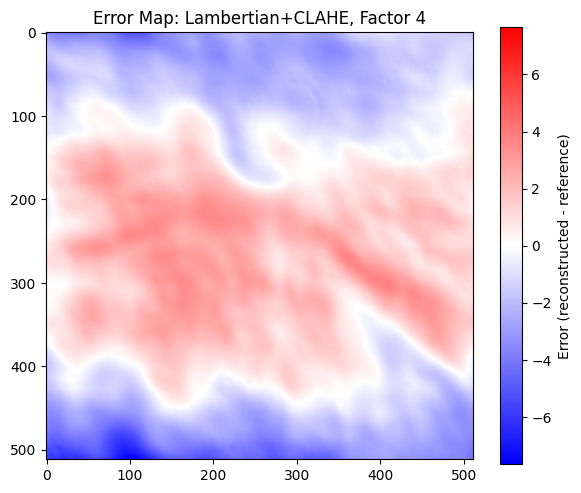

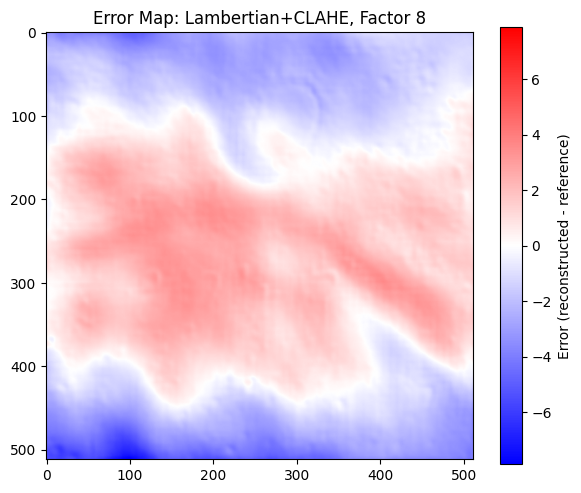

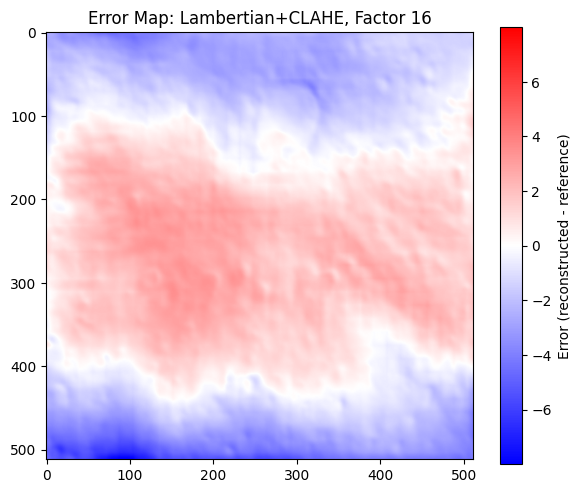

In [9]:
compute_error_maps(ref_dem=dem_lamb, recons=reconsA, names=['Lambertian', 'Lambertian+CLAHE'], factors=factors)

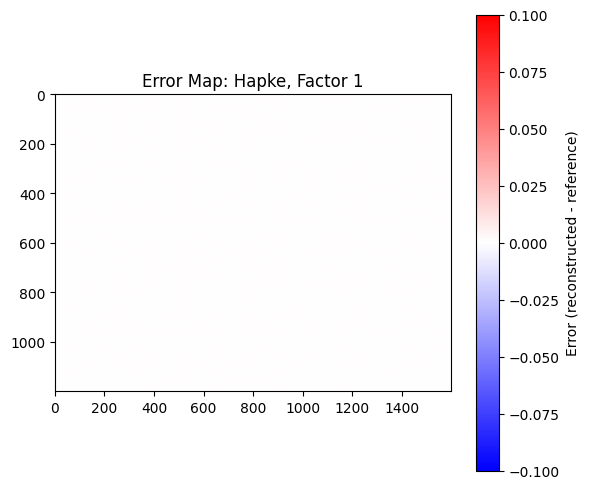

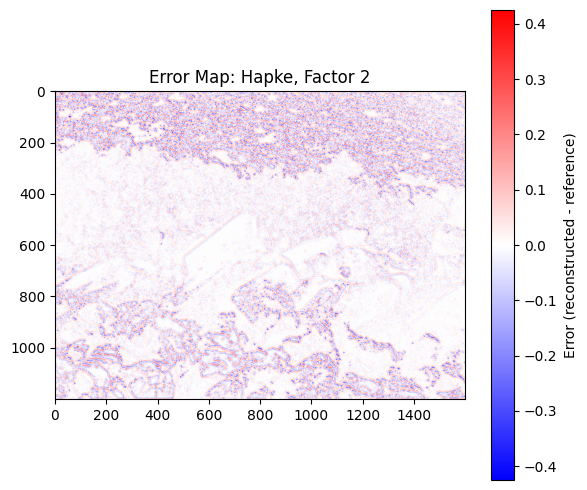

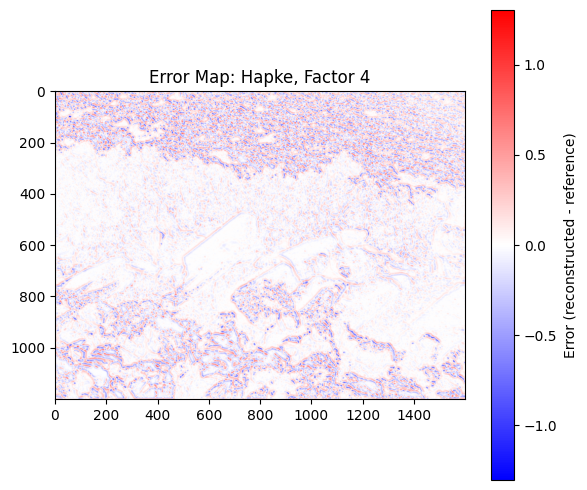

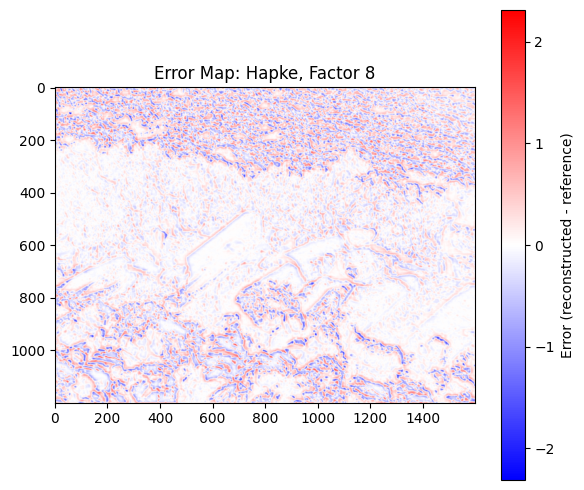

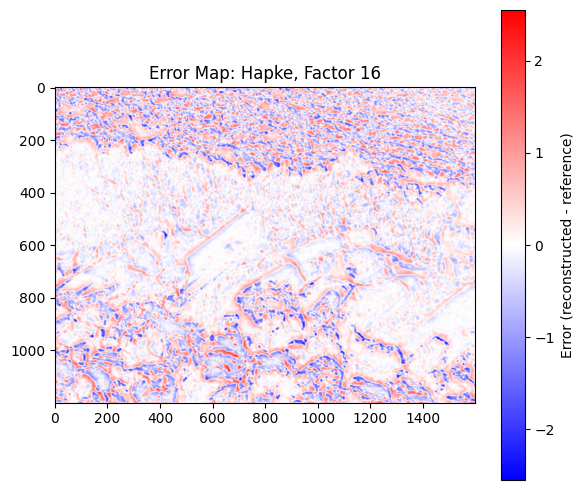

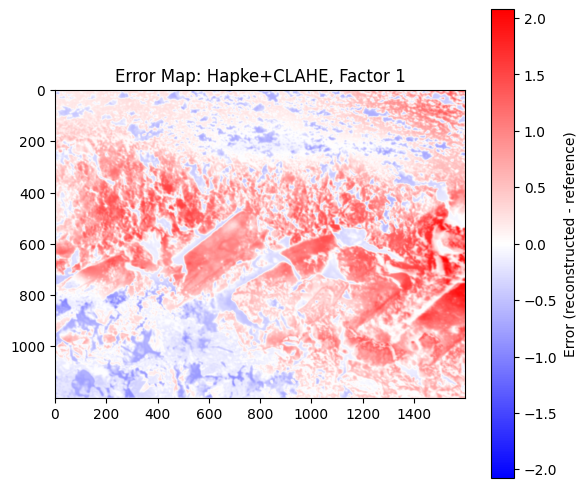

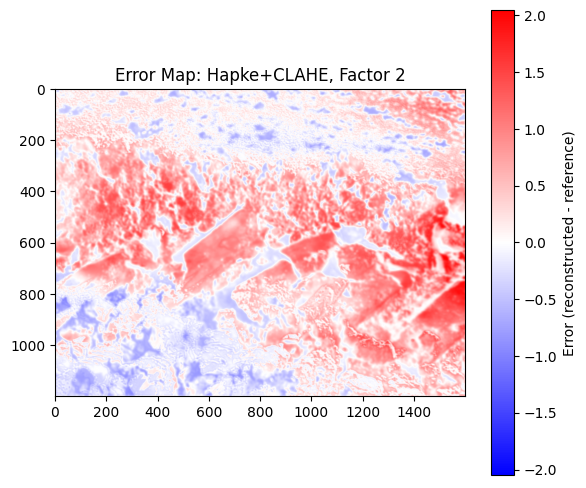

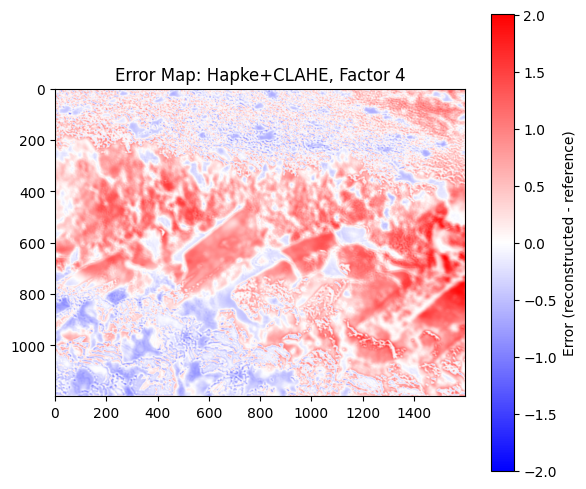

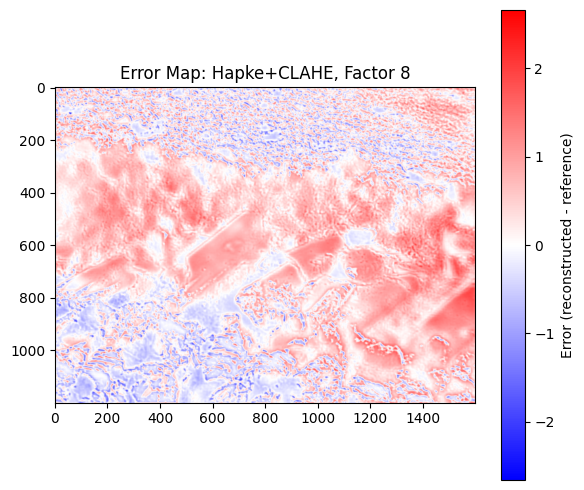

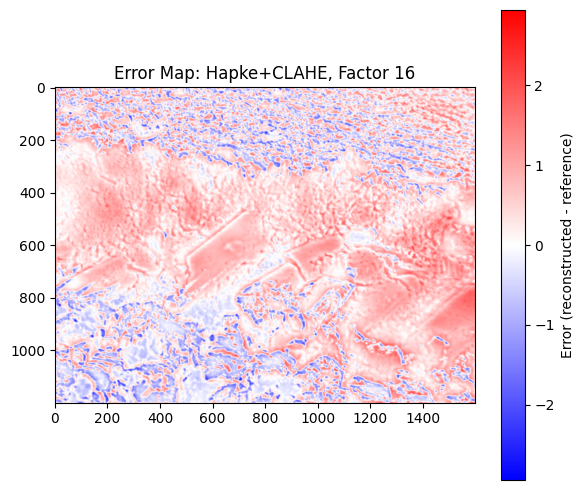

In [10]:
compute_error_maps(ref_dem=dem_hapke, recons=reconsB, names=['Hapke', 'Hapke+CLAHE'], factors=factors)

In [1]:
!pip install rasterio

Defaulting to user installation because normal site-packages is not writeable
  Using cached attrs-25.3.0-py3-none-any.whl.metadata (10 kB)
   ---------------------------------------- 0.0/25.4 MB ? eta -:--:--
   ---------------------------------------- 0.3/25.4 MB ? eta -:--:--
   ---------------------------------------- 0.3/25.4 MB ? eta -:--:--
   - -------------------------------------- 0.8/25.4 MB 1.1 MB/s eta 0:00:23
   - -------------------------------------- 1.0/25.4 MB 1.3 MB/s eta 0:00:19
   -- ------------------------------------- 1.6/25.4 MB 1.5 MB/s eta 0:00:17
   --- ------------------------------------ 2.1/25.4 MB 1.7 MB/s eta 0:00:14
   ---- ----------------------------------- 3.1/25.4 MB 2.2 MB/s eta 0:00:11
   ------ --------------------------------- 3.9/25.4 MB 2.4 MB/s eta 0:00:09
   ------- -------------------------------- 4.7/25.4 MB 2.6 MB/s eta 0:00:08
   --------- ------------------------------ 5.8/25.4 MB 2.8 MB/s eta 0:00:07
   ---------- --------------------


[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import rasterio
with rasterio.open(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\moon_dem_cropped.tif") as src:
    moon_dem = src.read(1)
print("Moon DEM shape:", moon_dem.shape)


Moon DEM shape: (2000, 2000)


In [4]:
from rasterio.enums import Resampling
import numpy as np

with rasterio.open(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\moon_dem_cropped.tif") as src:
    dem_resized = src.read(
        1,
        out_shape=(1, 512, 512),
        resampling=Resampling.bilinear
    )


In [8]:
import numpy as np

lambertian = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\lambertian_dem.npy")
lambertian_clahe = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\lambertian_clahe_dem.npy")
hapke = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\hapke_dem.npy")
hapke_clahe = np.load(r"C:\Users\Unnathi\OneDrive\IP LAB\IP_PROJECT_UNNATHI\hapke_clahe_dem.npy")

shapes=[lambertian, lambertian_clahe, hapke, hapke_clahe]
for i in range(len(shapes)):
    print(shapes[i].shape)



(512, 512)
(512, 512)
(1200, 1600)
(1200, 1600)


In [10]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math

def compare_dems(ref, test, name):
    ref_flat = ref.flatten()
    test_flat = test.flatten()

    rmse = math.sqrt(mean_squared_error(ref_flat, test_flat))
    mae = mean_absolute_error(ref_flat, test_flat)
    r2 = r2_score(ref_flat, test_flat)

    print(f"{name}: RMSE={rmse:.3f}, MAE={mae:.3f}, R²={r2:.3f}")

# Compare each with the Moon DEM
compare_dems(dem_resized, lambertian, "Lambertian")
compare_dems(dem_resized, lambertian_clahe, "Lambertian CLAHE")

Lambertian: RMSE=128.075, MAE=127.545, R²=-147.918
Lambertian CLAHE: RMSE=128.017, MAE=127.545, R²=-147.784


In [11]:
from skimage.transform import resize

# Match to Hapke size (1200, 1600)
dem_resized = resize(dem_resized, (1200, 1600), mode='reflect', anti_aliasing=True)
print("Resized Moon DEM shape:", dem_resized.shape)


Resized Moon DEM shape: (1200, 1600)


In [12]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math

def compare_dems(ref, test, name):
    ref_flat = ref.flatten()
    test_flat = test.flatten()
    rmse = math.sqrt(mean_squared_error(ref_flat, test_flat))
    mae = mean_absolute_error(ref_flat, test_flat)
    r2 = r2_score(ref_flat, test_flat)
    print(f"{name}: RMSE={rmse:.3f}, MAE={mae:.3f}, R²={r2:.3f}")

# Run comparisons
compare_dems(dem_resized, hapke, "Hapke")
compare_dems(dem_resized, hapke_clahe, "Hapke + CLAHE")


Hapke: RMSE=1.039, MAE=0.820, R²=-661.678
Hapke + CLAHE: RMSE=1.194, MAE=0.989, R²=-873.008
